In [1]:
import h5py
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd

from collections import defaultdict, Counter
from tqdm import tqdm

f = h5py.File('/ceph/hdd/students/zhzo/tdrive.h5', 'r')

In [2]:
list(f.keys())

['graph', 'trajectories']

In [3]:
graph = f['graph']
graph

<HDF5 group "/graph" (7 members)>

In [4]:
graph.keys()

<KeysViewHDF5 ['coordinate_scale', 'coordinate_shift', 'edge_features', 'edge_used_by_trajectory', 'edges', 'node_coordinates', 'node_features']>

In [5]:
graph['node_features'].keys()

<KeysViewHDF5 ['highway', 'x', 'y']>

In [6]:
graph['edges'][:]

array([[   0, 6154],
       [   0, 8268],
       [   0, 3616],
       ...,
       [9737, 9751],
       [9747, 9805],
       [9759, 9809]])

In [7]:
graph['edge_features'].keys()

<KeysViewHDF5 ['highway', 'lanes', 'length', 'maxspeed', 'name', 'oneway', 'osmid', 'reversed']>

In [39]:
graph['edge_features']['reversed'][:]

array([nan, nan, nan, ..., nan, nan, nan])

In [2]:
traj = f['trajectories']
traj['1364'].keys()

NameError: name 'f' is not defined

In [29]:
traj.keys()

<KeysViewHDF5 ['0', '1', '10', '100', '1000', '1001', '1002', '1003', '1004', '1005', '1006', '1007', '1008', '1009', '101', '1010', '1011', '1012', '1013', '1014', '1015', '1016', '1017', '1018', '1019', '102', '1020', '1021', '1022', '1023', '1024', '1025', '1026', '1027', '1028', '1029', '103', '1030', '1031', '1032', '1033', '1034', '1035', '1036', '1037', '1038', '1039', '104', '1040', '1041', '1042', '1043', '1044', '1045', '1046', '1047', '1048', '1049', '105', '1050', '1051', '1052', '1053', '1054', '1055', '1056', '1057', '1058', '1059', '106', '1060', '1061', '1062', '1063', '1064', '1065', '1066', '1067', '1068', '1069', '107', '1070', '1071', '1072', '1073', '1074', '1075', '1076', '1077', '1078', '1079', '108', '1080', '1081', '1082', '1083', '1084', '1085', '1086', '1087', '1088', '1089', '109', '1090', '1091', '1092', '1093', '1094', '1095', '1096', '1097', '1098', '1099', '11', '110', '1100', '1101', '1102', '1103', '1104', '1105', '1106', '1107', '1108', '1109', '111',

In [1]:
traj['1110']['edge_orientations'][:]

NameError: name 'traj' is not defined

In [ ]:
traj['1110']['edge_idxs'][:]

In [21]:
graph['edge_used_by_trajectory'][:]

array([    0,     2,     6, ..., 16778, 16779, 16782])

In [31]:
traj['1110']['taxi_idx']

<HDF5 dataset "taxi_idx": shape (), type "|O">

In [22]:
#graph['edge_features']['osmid']['100'][:]

In [32]:
#traj['10028.txt']['subtrajectories']['0'].keys()

In [33]:
#traj['10028.txt']['subtrajectories']['0']['timestamps']

In [38]:
traj['10028.txt']['raw_coordinates']

<HDF5 dataset "raw_coordinates": shape (1579, 2), type "<f8">

In [34]:
g = nx.from_edgelist(graph['edges'][()])
nx.set_node_attributes(g, {k: x for k, x in enumerate(graph['node_coordinates'][()])}, 'loc')

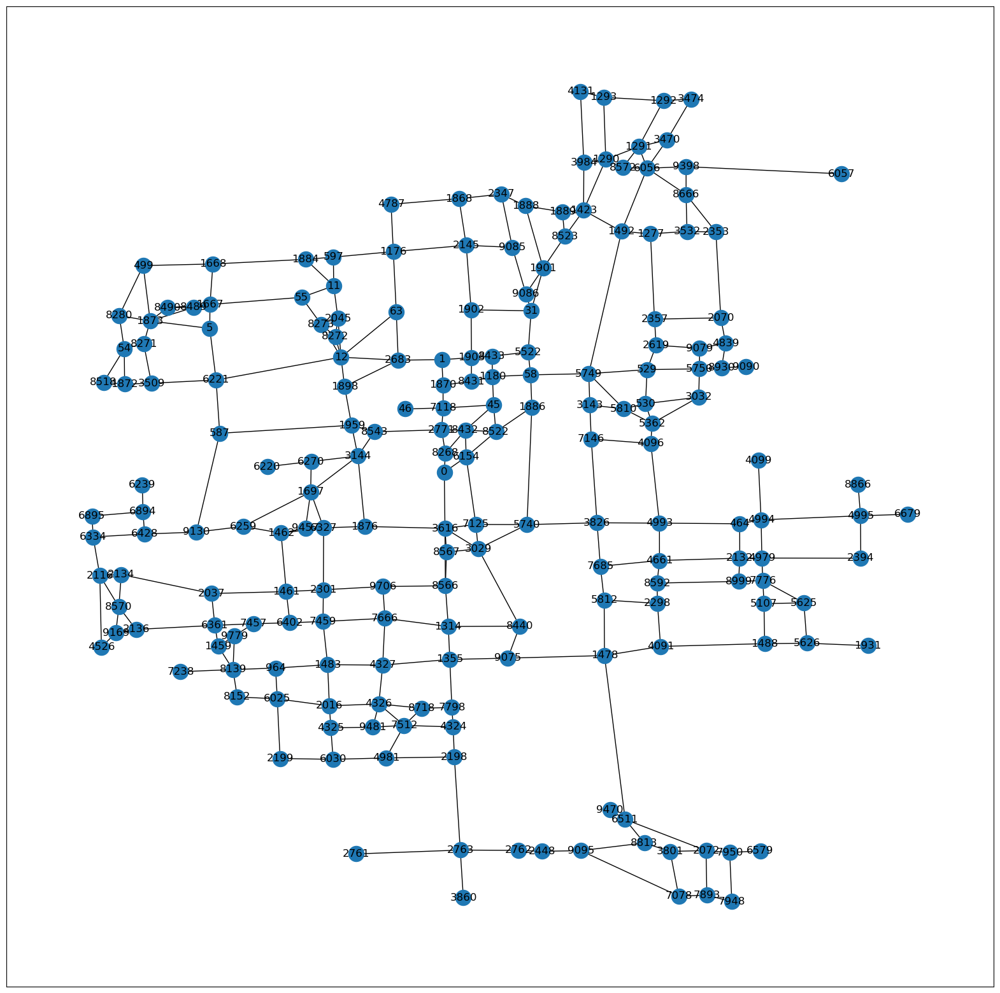

In [35]:
# Plot small sub graph

k = 9

fig, ax = plt.subplots(figsize=(20, 20))
sub_g = nx.subgraph(g, nx.single_source_shortest_path_length(g, 0, cutoff=k).keys())
pos = nx.get_node_attributes(sub_g, 'loc')
nx.draw_networkx(sub_g, ax=ax, pos=pos, arrows=True)

In [36]:
# Stats
n_edges = len(g.edges)
node_strs = [str(i) for i in range(n_edges)]
oneway = np.array([graph['edge_features']['oneway'][n][:][0] for n in node_strs])
reversed_values = np.array([graph['edge_features']['reversed'][n][:][0] for n in node_strs])
length_values = np.array([graph['edge_features']['length'][n][:][0] for n in node_strs])
lanes_values = np.array([graph['edge_features']['lanes'][n][:][0] for n in node_strs])
maxspeed_values = np.array([graph['edge_features']['maxspeed'][n][:][0] for n in node_strs])
degrees = np.array(list(dict(g.degree).values()))

print(f"Number of nodes: {len(g.nodes)}")
print(f"Number of edges: {len(g.edges)}")
print(f"Is directed: {g.is_directed()}")
print(f"Min/Mean/Max degree of nodes: {degrees.min()}/{degrees.mean():.2f}/{degrees.max()}")
print(f"Oneways: {oneway.sum()}/{n_edges} ({100*oneway.mean():.2f})")
print(f"Reversed: {reversed_values.sum()}/{n_edges} ({100*reversed_values.mean():.2f})")
print(f"Min/Mean/Max values of length: {length_values.min()}/{length_values.mean():.2f}/{length_values.max()}")
print(f"Min/Mean/Max values of lanes: {lanes_values.min()}/{lanes_values.mean():.2f}/{lanes_values.max()}")
print(f"Min/Mean/Max values of max speed: {np.nanmin(maxspeed_values)}/{np.nanmean(maxspeed_values):.2f}/{np.nanmax(maxspeed_values)} ({np.isnan(maxspeed_values).mean()*100:.2f}% are NaN)")

ValueError: Field names only allowed for compound types

In [87]:
# Street type

highways = np.array([graph['edge_features']['highway'][n][:][0] for n in node_strs])
highway_values, highway_encoded, highway_counts = np.unique(highways, return_inverse=True, return_counts=True)

print(f"There are {len(highway_values)} different types of streets")
for val, c in zip(highway_values, highway_counts):
    print(f"{val}: {c} ({100*c/n_edges:.2f}%)")

There are 9 different types of streets
b'cycleway': 331 (1.97%)
b'motorway': 364 (2.17%)
b'pedestrian': 58 (0.35%)
b'primary': 1386 (8.26%)
b'residential': 6582 (39.22%)
b'secondary': 1417 (8.44%)
b'tertiary': 4756 (28.34%)
b'trunk': 794 (4.73%)
b'unclassified': 1096 (6.53%)


([<matplotlib.patches.Wedge at 0x7f3a60323530>,
 [Text(1.0978894843641613, 0.06810785654090229, "b'cycleway'"),
  Text(1.0797776767918807, 0.2099527773141597, "b'motorway'"),
  Text(1.0598441869359445, 0.2945000839016641, "b'pedestrian'"),
  Text(0.9427331807009585, 0.5667928634037783, "b'primary'"),
  Text(-0.4902687973410382, 0.9847012269484446, "b'residential'"),
  Text(-1.0180703166816627, -0.41657271909199584, "b'secondary'"),
  Text(-0.02964546021660663, -1.0996004486578503, "b'tertiary'"),
  Text(0.9326151542961576, -0.5832915000042039, "b'trunk'"),
  Text(1.076934153407448, -0.22408219301092056, "b'unclassified'")])

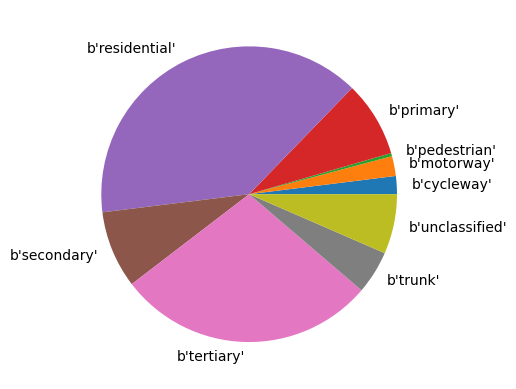

In [88]:
plt.pie(highway_counts, labels=highway_values)

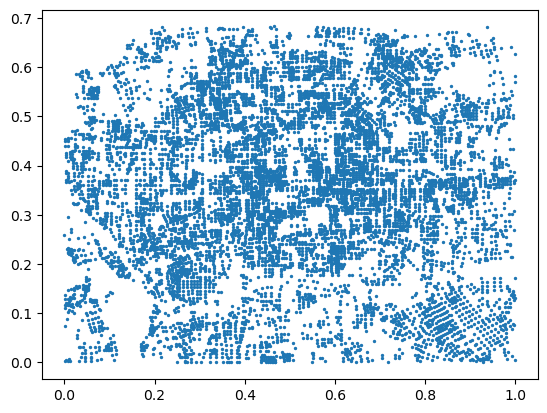

In [89]:
# Positions of nodes
positions = np.array(list(nx.get_node_attributes(g, 'loc').values()))
plt.scatter(positions[:, 0], positions[:, 1], s=2)

In [90]:
# Street names
street_names = np.array([graph['edge_features']['name'][n][:][0] for n in node_strs])

streetname_values, streetname_encoded, streetname_counts = np.unique(street_names, return_inverse=True, return_counts=True)
print(f"There are {len(streetname_values)} different street names")

streetname_dict = dict(zip(streetname_values, streetname_counts))
# works only with python >=3.8
# https://stackoverflow.com/questions/613183/how-do-i-sort-a-dictionary-by-value
streetname_dict = dict(sorted(streetname_dict.items(), key=lambda item: item[1], reverse=True))

print(f"The ten most common:")
for val in list(streetname_dict.keys())[:10]:
    print(f"{val}: {streetname_dict[val]} ({100*streetname_dict[val]/n_edges:.2f}%)")

There are 2074 different street names
The ten most common:
b'nan': 7422 (44.22%)
b'\xe5\x8c\x97\xe4\xba\x94\xe7\x8e\xaf': 65 (0.39%)
b'\xe5\x8c\x97\xe4\xb8\x89\xe7\x8e\xaf': 64 (0.38%)
b'\xe8\xa5\xbf\xe4\xba\x94\xe7\x8e\xaf': 51 (0.30%)
b'\xe4\xb8\x9c\xe4\xb8\x89\xe7\x8e\xaf': 50 (0.30%)
b'\xe4\xb8\x9c\xe4\xba\x94\xe7\x8e\xaf': 44 (0.26%)
b'\xe5\x8c\x97\xe4\xba\xac-\xe6\xb8\xaf\xe6\xbe\xb3\xe9\xab\x98\xe9\x80\x9f\xe5\x85\xac\xe8\xb7\xaf': 40 (0.24%)
b'\xe5\xa4\x8d\xe5\x85\xb4\xe8\xb7\xaf': 39 (0.23%)
b'\xe8\xa5\xbf\xe4\xba\x8c\xe7\x8e\xaf': 38 (0.23%)
b'\xe9\xa6\x96\xe9\x83\xbd\xe6\x9c\xba\xe5\x9c\xba\xe9\xab\x98\xe9\x80\x9f\xe5\x85\xac\xe8\xb7\xaf': 37 (0.22%)


In [10]:
trajects = f['trajectories']
trajects.keys()

<KeysViewHDF5 ['1.txt', '10.txt', '100.txt', '1000.txt', '10000.txt', '10001.txt', '10002.txt', '10003.txt', '10004.txt', '10005.txt', '10006.txt', '10007.txt', '10008.txt', '10009.txt', '1001.txt', '10010.txt', '10011.txt', '10012.txt', '10013.txt', '10014.txt', '10015.txt', '10016.txt', '10017.txt', '10018.txt', '10019.txt', '1002.txt', '10020.txt', '10021.txt', '10022.txt', '10023.txt', '10024.txt', '10025.txt', '10026.txt', '10027.txt', '10028.txt', '10029.txt', '1003.txt', '10030.txt', '10031.txt', '10032.txt', '10033.txt', '10034.txt', '10035.txt', '10036.txt', '10037.txt', '10038.txt', '10039.txt', '1004.txt', '10040.txt', '10041.txt', '10042.txt', '10043.txt', '10044.txt', '10045.txt', '10046.txt', '10047.txt', '10048.txt', '10049.txt', '1005.txt', '10050.txt', '10051.txt', '10052.txt', '10053.txt', '10054.txt', '10055.txt', '10056.txt', '10057.txt', '10058.txt', '10059.txt', '1006.txt', '10060.txt', '10061.txt', '10062.txt', '10063.txt', '10064.txt', '10065.txt', '10066.txt', 

In [132]:
trajects['10028.txt'].keys()

<KeysViewHDF5 ['discarded_mask', 'raw_coordinates', 'raw_timestamps', 'subtrajectories']>

In [133]:
#trajects['000']['20081023025304.plt'].keys()

In [13]:
trajectories = []
sub_idx = []

for k in trajects.keys():
    #print(f"{k}:")
    for s in trajects[k]['subtrajectories'].keys():
        trajectories.append(trajects[k]['subtrajectories'][s]['edge_idxs'][:])
        sub_idx.append({trajects[k], trajects[k]['subtrajectories'][s]})

len(trajectories)

2414

In [30]:
len(sub_idx)

2414

In [63]:
trajectories[800]

array([12815])

In [64]:
sub_idx[800]

{<HDF5 group "/trajectories/335.txt" (4 members)>,
 <HDF5 group "/trajectories/335.txt/subtrajectories/3" (6 members)>}

In [136]:
x = trajects['10028.txt']['raw_coordinates'][:]

In [137]:
def get_trajectory(trajects):
    x = trajects['10028.txt']['raw_coordinates'][:]
    times = trajects['10028.txt']['raw_timestamps'][:]

    dists = np.linalg.norm(x[1:] - x[:-1], axis=1)
    time_diffs = times[1:] - times[:-1]
    velos = dists / time_diffs
    
    return x, velos, times

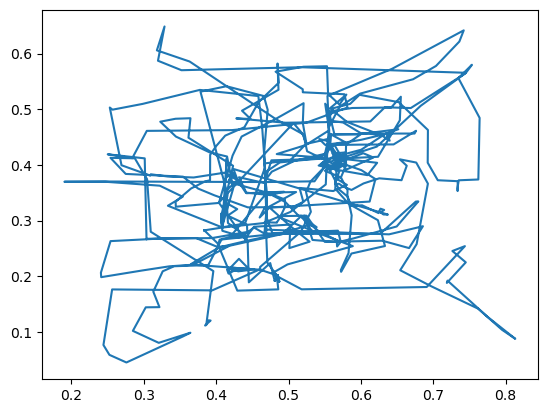

In [138]:
plt.plot(x[:, 0], x[:, 1])

(0.04261306206296408, 0.6812789592529448)

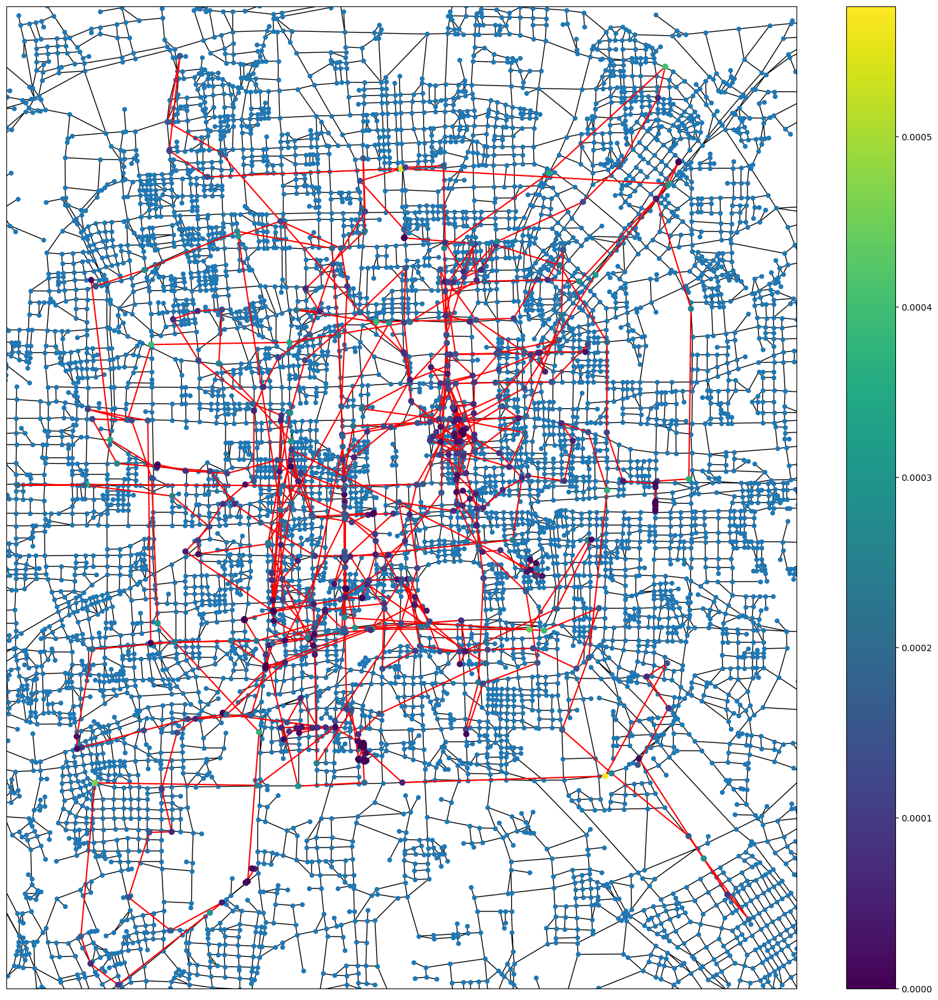

In [110]:
x, velos, times = get_trajectory(trajects)
k = 200

fig, ax = plt.subplots(figsize=(20, 20))
sub_g = nx.subgraph(g, nx.single_source_shortest_path_length(g, 418, cutoff=k).keys())
pos = nx.get_node_attributes(sub_g, 'loc')
nx.draw_networkx(sub_g, ax=ax, pos=pos, arrows=True, node_size=20, with_labels=False)
ax.plot(x[:, 0], x[:, 1], color='red')
sc = ax.scatter(x[1:, 0], x[1:, 1], c=velos, zorder=100)
fig.colorbar(sc)
ax.set_xlim((x[:, 0].min()*0.95, x[:, 0].max()*1.05))
ax.set_ylim((x[:, 1].min()*0.95, x[:, 1].max()*1.05))
#nx.draw_networkx_nodes(sub_g, nodelist=trajectories[0], ax=ax, pos=pos, node_color='red')

(0.04261306206296408, 0.6812789592529448)

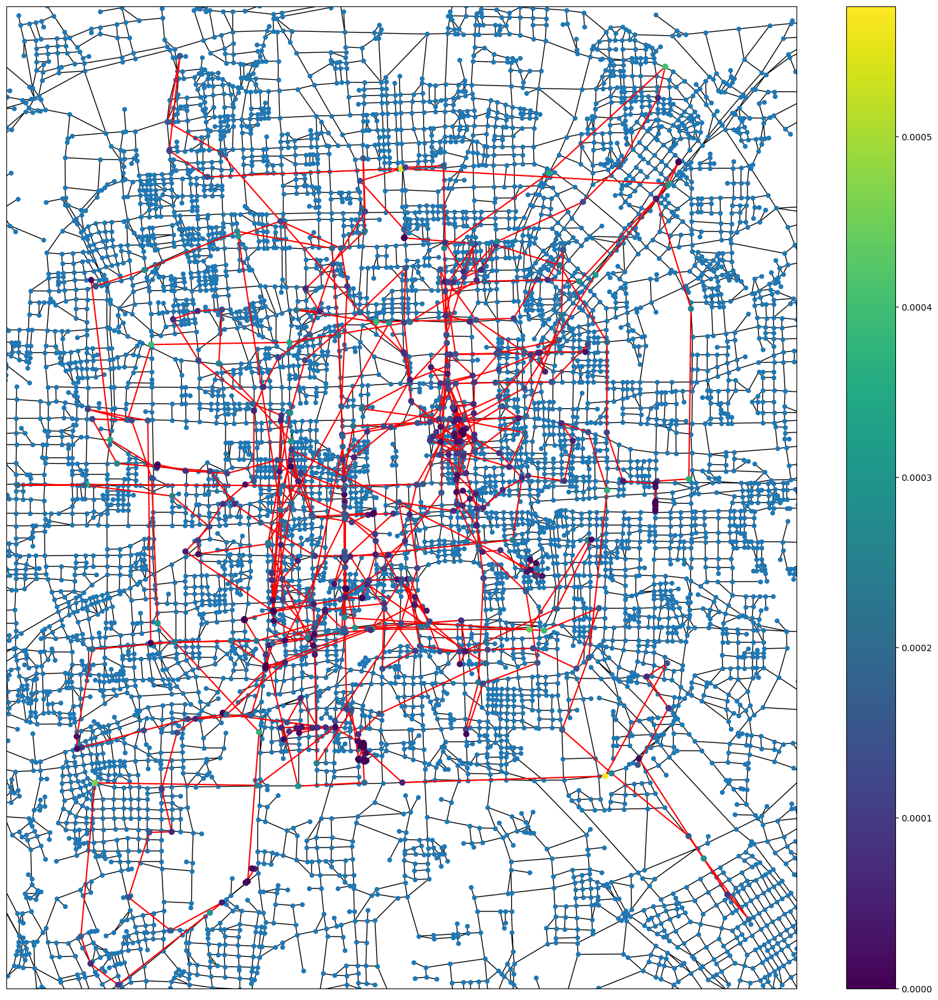

In [111]:
k = 200
x, velos, times = get_trajectory(trajects)

fig, ax = plt.subplots(figsize=(20, 20))
sub_g = nx.subgraph(g, nx.single_source_shortest_path_length(g, 8511, cutoff=k).keys())
pos = nx.get_node_attributes(sub_g, 'loc')
nx.draw_networkx(sub_g, ax=ax, pos=pos, arrows=True, node_size=20, with_labels=False)
#nx.draw_networkx(sub_g, ax=ax, pos=pos, arrows=True, node_size=300, with_labels=True)
ax.plot(x[:, 0], x[:, 1], color='red')
sc = ax.scatter(x[1:, 0], x[1:, 1], c=velos, zorder=10)
fig.colorbar(sc)
ax.set_xlim((x[:, 0].min()*0.95, x[:, 0].max()*1.05))
ax.set_ylim((x[:, 1].min()*0.95, x[:, 1].max()*1.05))
#nx.draw_networkx_nodes(sub_g, nodelist=trajectories[0], ax=ax, pos=pos, node_color='red')

In [112]:
x.shape, times.shape

((1579, 2), (1579,))

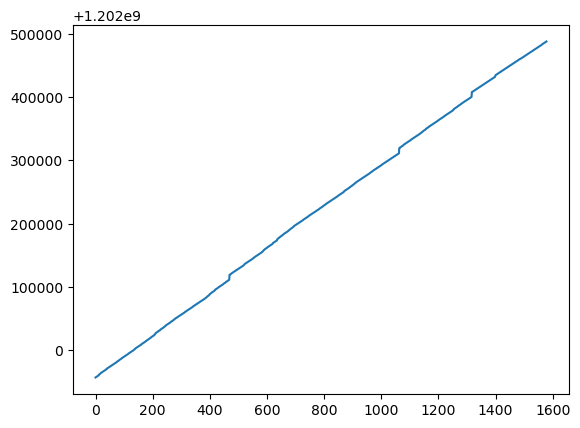

In [113]:
plt.plot(np.arange(len(times)), times)

In [115]:
trajects['10028.txt'].keys()

<KeysViewHDF5 ['discarded_mask', 'raw_coordinates', 'raw_timestamps', 'subtrajectories']>

In [116]:
trajects['10028.txt']['subtrajectories'].keys()

<KeysViewHDF5 ['0', '1', '10', '11', '2', '3', '4', '5', '6', '7', '8', '9']>

In [118]:
trajects['10028.txt']['subtrajectories']['0'].keys()
#['edge_idxs'][:].shape

<KeysViewHDF5 ['coordinates', 'distance_observation_to_matched_edge', 'edge_idxs', 'edge_observation_ranges', 'edge_orientations', 'timestamps']>

In [123]:
trajects['10028.txt']['subtrajectories']['0']['edge_observation_ranges'][:]

array([[  0,   8],
       [  8,   8],
       [  8,  10],
       ...,
       [160, 161],
       [161, 183],
       [183, 207]])

In [26]:
edges = trajects['9919.txt']['subtrajectories']['12']['edge_idxs'][:]
edges

<KeysViewHDF5 ['coordinates', 'distance_observation_to_matched_edge', 'edge_idxs', 'edge_observation_ranges', 'edge_orientations', 'timestamps']>

In [14]:
all_edges = graph['edges'][()]

print(all_edges[edges])

[[2027 2205]
 [2027 7610]
 [ 906 7610]
 ...
 [3522 4392]
 [3522 4392]
 [3522 4394]]


(0.17946962361186883, 0.6812789592529448)

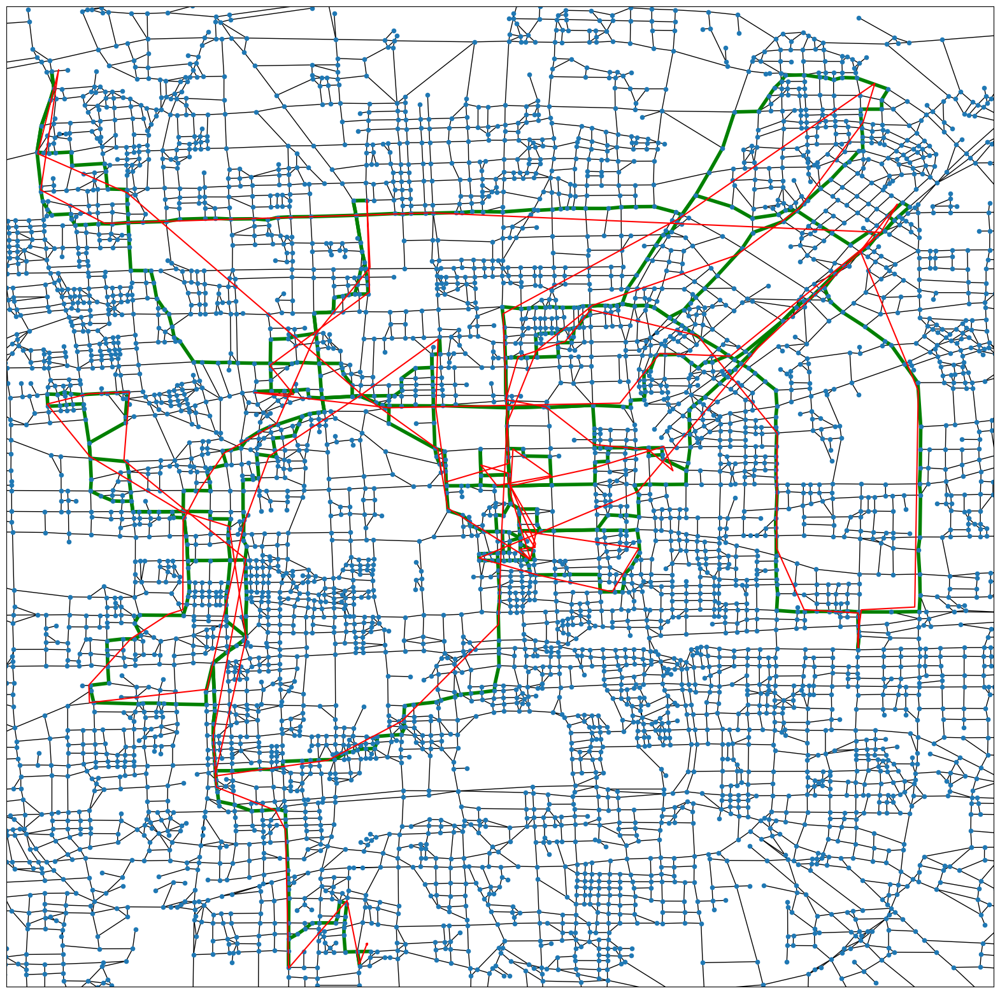

In [141]:
x = trajects['10028.txt']['subtrajectories']['0']['coordinates'][:]

k = 200

fig, ax = plt.subplots(figsize=(20, 20))
sub_g = nx.subgraph(g, nx.single_source_shortest_path_length(g, 8511, cutoff=k).keys())
pos = nx.get_node_attributes(sub_g, 'loc')
nx.draw_networkx(sub_g, ax=ax, pos=pos, arrows=True, node_size=20, with_labels=False)

nx.draw_networkx_edges(g, pos, edgelist=all_edges[edges], edge_color='green', width=4)
ax.plot(x[:, 0], x[:, 1], color='red')
fig.colorbar(sc)
ax.set_xlim((x[:, 0].min()*0.95, x[:, 0].max()*1.05))
ax.set_ylim((x[:, 1].min()*0.95, x[:, 1].max()*1.05))

(0.04261306206296408, 0.6812789592529448)

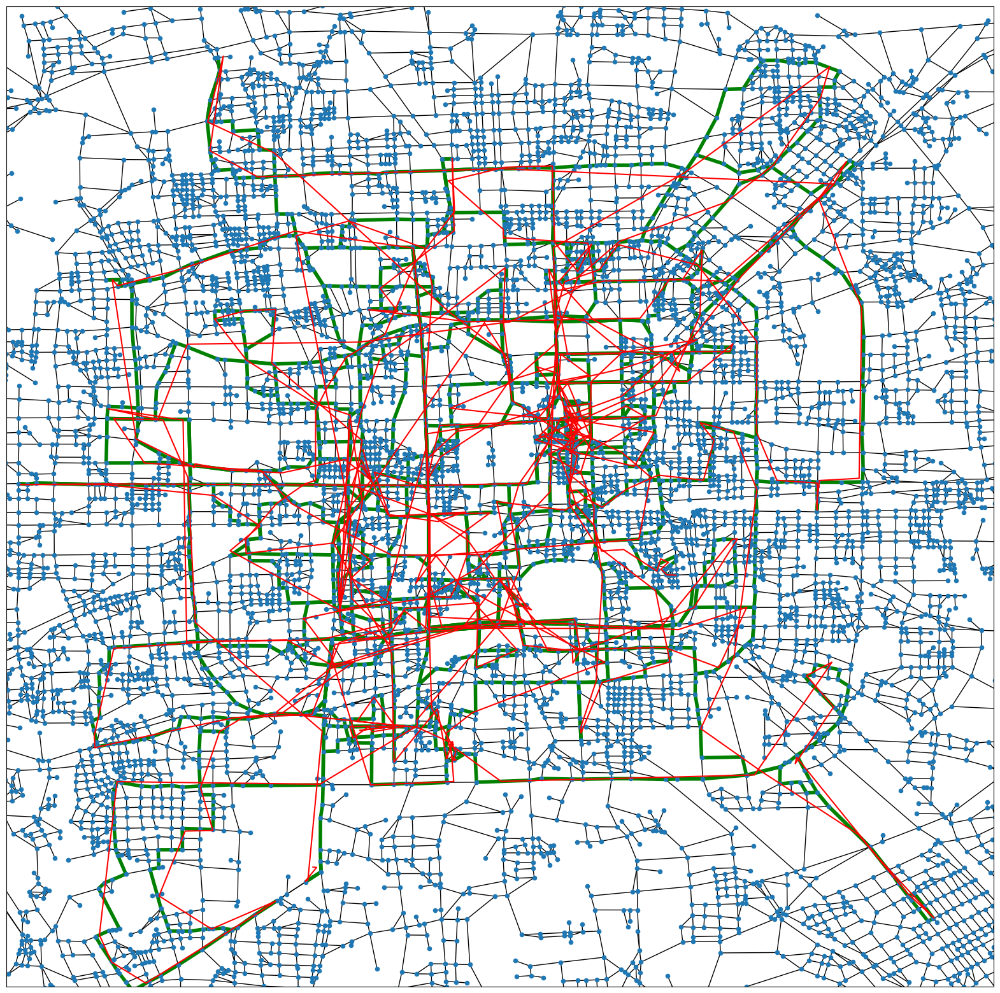

In [142]:
x = trajects['10028.txt']['subtrajectories']['0']['coordinates'][:]

fig, ax = plt.subplots(figsize=(20, 20))
sub_g = nx.subgraph(g, nx.single_source_shortest_path_length(g, 8511, cutoff=k).keys())
pos = nx.get_node_attributes(sub_g, 'loc')
nx.draw_networkx(sub_g, ax=ax, pos=pos, arrows=True, node_size=20, with_labels=False)

x0_min, x0_max = 100, -100
x1_min, x1_max = 100, -100

for key in trajects['10028.txt']['subtrajectories']:
    x = trajects['10028.txt']['subtrajectories'][key]['coordinates'][:]
    edges = trajects['10028.txt']['subtrajectories'][key]['edge_idxs'][:]
    nx.draw_networkx_edges(g, pos, edgelist=all_edges[edges], edge_color='green', width=4)
    ax.plot(x[:, 0], x[:, 1], color='red')
    x0_min = min(x0_min, x[:, 0].min())
    x0_max = max(x0_max, x[:, 0].max())
    x1_min = min(x1_min, x[:, 1].min())
    x1_max = max(x1_max, x[:, 1].max())

ax.set_xlim((x0_min*0.95, x0_max*1.05))
ax.set_ylim((x1_min*0.95, x1_max*1.05))

In [143]:
for x in trajects['10028.txt']['subtrajectories']:
    print(trajects['10028.txt']['subtrajectories'][x])

<HDF5 group "/trajectories/10028.txt/subtrajectories/0" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/1" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/10" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/11" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/2" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/3" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/4" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/5" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/6" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/7" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/8" (6 members)>
<HDF5 group "/trajectories/10028.txt/subtrajectories/9" (6 members)>


KeyError: 9562

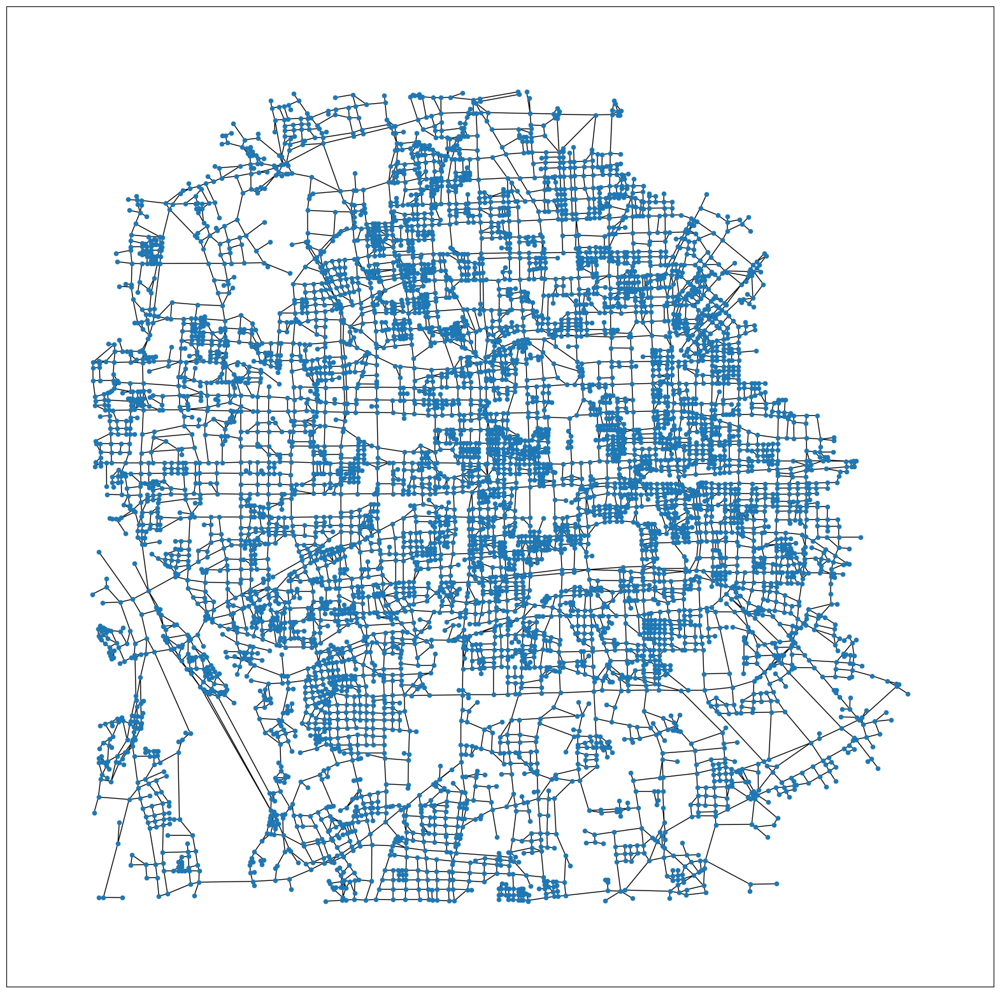

In [17]:
x = trajects['10028.txt']['subtrajectories']['7']['coordinates'][:]
k = 50
fig, ax = plt.subplots(figsize=(20, 20))
sub_g = nx.subgraph(g, nx.single_source_shortest_path_length(g, 8511, cutoff=k).keys())
pos = nx.get_node_attributes(sub_g, 'loc')
nx.draw_networkx(sub_g, ax=ax, pos=pos, arrows=True, node_size=20, with_labels=False)

x0_min, x0_max = 100, -100
x1_min, x1_max = 100, -100

for key in trajects['10028.txt']['subtrajectories']:
    x = trajects['10028.txt']['subtrajectories'][key]['coordinates'][:]
    edges = trajects['10028.txt']['subtrajectories'][key]['edge_idxs'][:]
    nx.draw_networkx_edges(g, pos, edgelist=all_edges[edges], edge_color='green', width=4)
    ax.plot(x[:, 0], x[:, 1], color='red')
    x0_min = min(x0_min, x[:, 0].min())
    x0_max = max(x0_max, x[:, 0].max())
    x1_min = min(x1_min, x[:, 1].min())
    x1_max = max(x1_max, x[:, 1].max())

ax.set_xlim((x0_min*0.95, x0_max*1.05))
ax.set_ylim((x1_min*0.95, x1_max*1.05))

In [ ]:
#Beginning here are copied from the file t-drive / geolife analysis

In [18]:
GEOLIFE, TDRIVE = 'geolife', 'tdrive'

WHICH = TDRIVE

unit_to_meters = 1 / 0.0000299927
unit_to_meters

33341.44641862853

In [19]:

if WHICH == GEOLIFE:
    paths = dict()

    # parse all paths
    merged_path = '/nfs/staff-ssd/fuchsgru/GeoLife/merged.h5'
    with h5py.File(merged_path) as hf:
        for user_idx in tqdm(list(hf['trajectories'].keys())):
            for record_file in hf['trajectories'][user_idx].keys():
                for subtrajectory_idx in hf['trajectories'][user_idx][record_file]['subtrajectories'].keys():
                    subtrajectory_group = hf['trajectories'][user_idx][record_file]['subtrajectories'][subtrajectory_idx]
                    path = {attr : subtrajectory_group[attr][:] for attr in subtrajectory_group.keys()}
                    paths[(user_idx, record_file, subtrajectory_idx)] = path
elif WHICH == TDRIVE:
    
    paths = dict()
    merged_path = '/ceph/hdd/students/zhzo/T-drive/merged.h5'
    with h5py.File(merged_path) as hf:
        for taxi_idx in tqdm(list(hf['trajectories'].keys())):
            for subtrajectory_idx in hf['trajectories'][taxi_idx]['subtrajectories'].keys():
                #print (hf['trajectories'][taxi_idx]['subtrajectories'][subtrajectory_idx])
                subtrajectory_group = hf['trajectories'][taxi_idx]['subtrajectories'][subtrajectory_idx]
                path = {attr : subtrajectory_group[attr][:] for attr in subtrajectory_group.keys()}
                assert (taxi_idx, subtrajectory_idx) not in paths
                paths[(taxi_idx, subtrajectory_idx)] = path
    

100%|███████████████████████████████████████████████████████████████| 10336/10336 [00:05<00:00, 1756.64it/s]


In [21]:
len(paths)

2414

In [31]:
with h5py.File(merged_path) as hf:
    node_coordinates = hf['graph']['node_coordinates'][:]
    edges = hf['graph']['edges'][:]

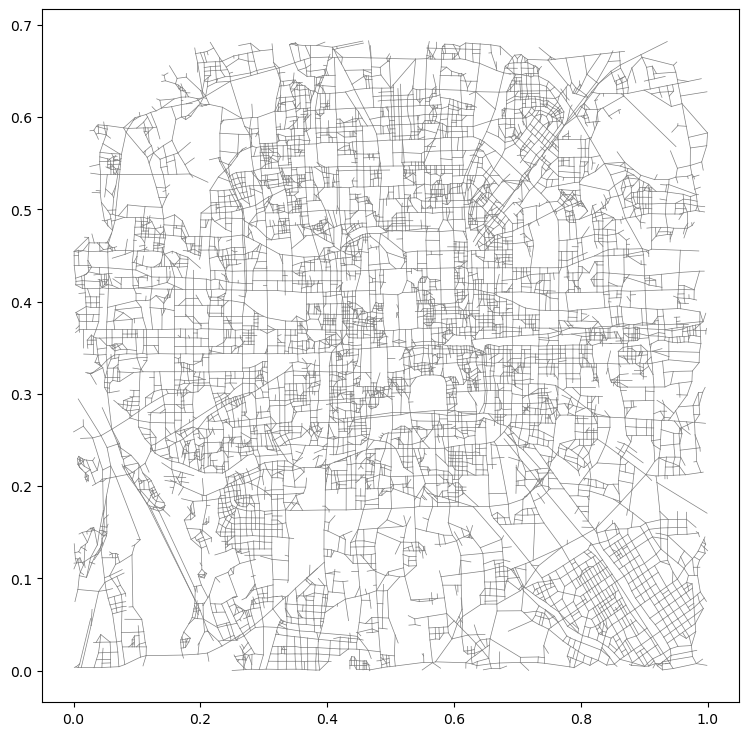

In [150]:
fig, ax = plt.subplots(figsize=(9, 9))
with h5py.File(merged_path) as hf:
    node_coordinates = hf['graph']['node_coordinates'][:]
    edges = hf['graph']['edges'][:]
    for ec in node_coordinates[edges]:
        ax.plot(ec[:, 0], ec[:, 1], c='grey', lw=.5)

In [23]:
print(node_coordinates.shape, edges.shape)

(9812, 2) (16784, 2)


1383 2414


Text(0.5, 0, 'Avg Distance Observation -> Edge')

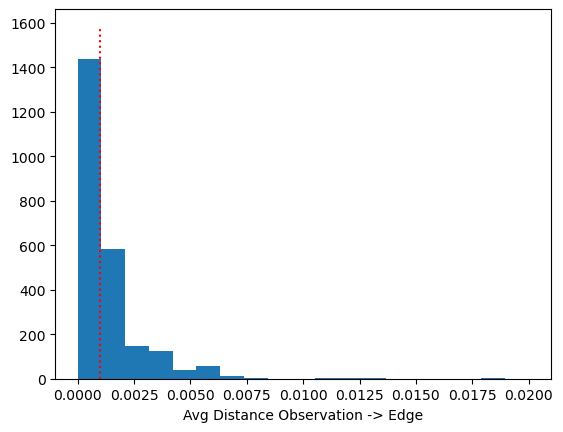

In [152]:

# Distribution of means of edge distance
mean_observation_to_edge_distances = dict()

for key, subtrajectory_group in paths.items():
    mean_observation_to_edge_distances[key] = \
        subtrajectory_group['distance_observation_to_matched_edge'][:].mean()       
print((np.array(list(mean_observation_to_edge_distances.values())) < 1e-3).sum(), len(mean_observation_to_edge_distances))

fig, ax = plt.subplots()


counts, _, _ = ax.hist(np.array(list(mean_observation_to_edge_distances.values())), bins=np.linspace(0, 0.02, 20))
ax.vlines(1e-3, 0, 1.1 * counts.max(), color='red', linestyle='dotted')
#ax.set_xscale('log')
ax.set_xlabel('Avg Distance Observation -> Edge')

('9040.txt', '8')
('9040.txt', '8')
('9040.txt', '8')
('9040.txt', '8')


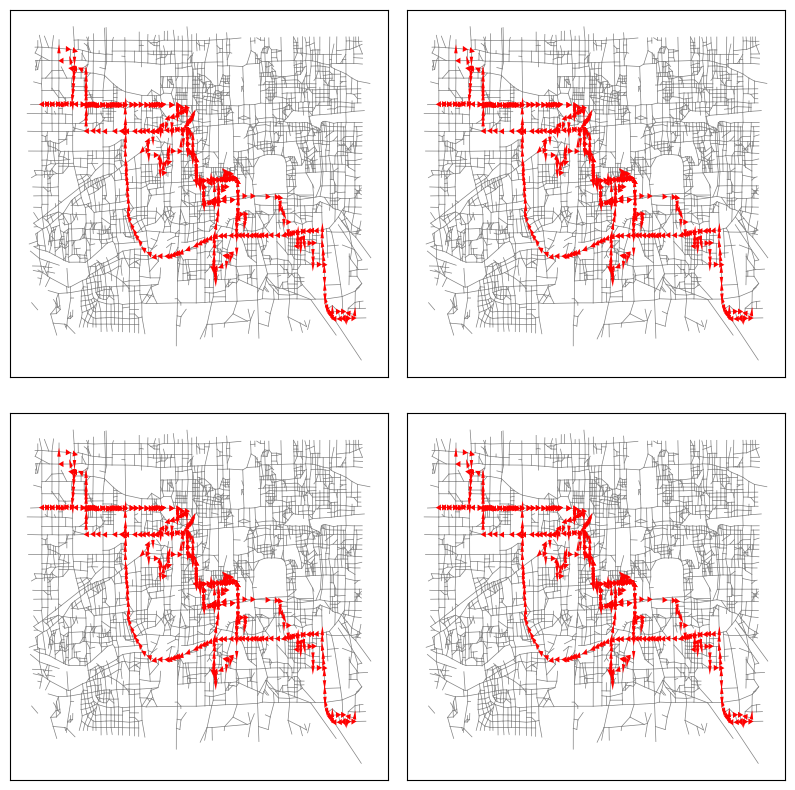

In [34]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10), gridspec_kw={'wspace' : 0.05, 'hspace' : 0.1})
keys = list(paths.keys())
#print(keys)
with h5py.File(merged_path) as hf:
    for ax in axs.flatten():
        #key = keys[np.random.choice(len(keys))]
        key = ('9040.txt', '8')
        path = paths[key]
        #print(path)
        trajectory_coordinates = path['coordinates']
        trajectory_timestamps = path['timestamps']
        trajectory_edge_orientations = path['edge_orientations']
        trajectory_edge_idxs = path['edge_idxs']

        xmin, xmax = trajectory_coordinates.min(axis=0), trajectory_coordinates.max(axis=0)
        edge_mask = (node_coordinates[edges] >= xmin[None, :] - 0.01).all(-1).any(-1) & (node_coordinates[edges] <= xmax[None, :] + 0.01).all(-1).any(-1) 
        
        all_c = node_coordinates[edges[edge_mask]].reshape((-1, 2))
        arrow_width = (all_c.max(axis=0) - all_c.min(axis=0)).max() * 0.01
        
        for ec, edge_idx in zip(node_coordinates[edges][edge_mask], np.arange(edges.shape[0], dtype=int)[edge_mask]):
            ax.plot(ec[:, 0], ec[:, 1], c='grey', lw=.5) #, c=1 - np.array((c, c, c, 0)))
            #ax1.arrow(*ec.mean(axis=0), *(np.diff(ec, axis=0).flatten() * 0.1 * ))
        for ec, orient in zip(node_coordinates[edges][trajectory_edge_idxs], trajectory_edge_orientations):
            #ax1.plot(ec[:, 0], ec[:, 1], c='red', lw=2, ls='dotted') #, c=1 - np.array((c, c, c, 0)))
            ax.arrow(*ec.mean(axis=0), *(np.diff(ec, axis=0).flatten() * 0.1 * orient), shape='full', ec='none', fc='red', 
                      width=0, head_width=arrow_width, zorder=2)
        c = trajectory_timestamps - trajectory_timestamps.min()
        c /= c.max()
        #ax.scatter(trajectory_coordinates[:, 0], trajectory_coordinates[:, 1], alpha=.9, marker='x', s=10, c=c, cmap='viridis')
        ax.set_xticks([])
        ax.set_yticks([])
        print(key)
        if WHICH == GEOLIFE:
            ax.set_title(f'Avg Dist. Observation->edge: {(mean_observation_to_edge_distances[key]* unit_to_meters):.2f}m')

Edge Distribution

In [154]:
edge_cnt = Counter()
for key, path in paths.items():
    for edge_idx in set(path['edge_idxs']):
        edge_cnt[edge_idx] += 1

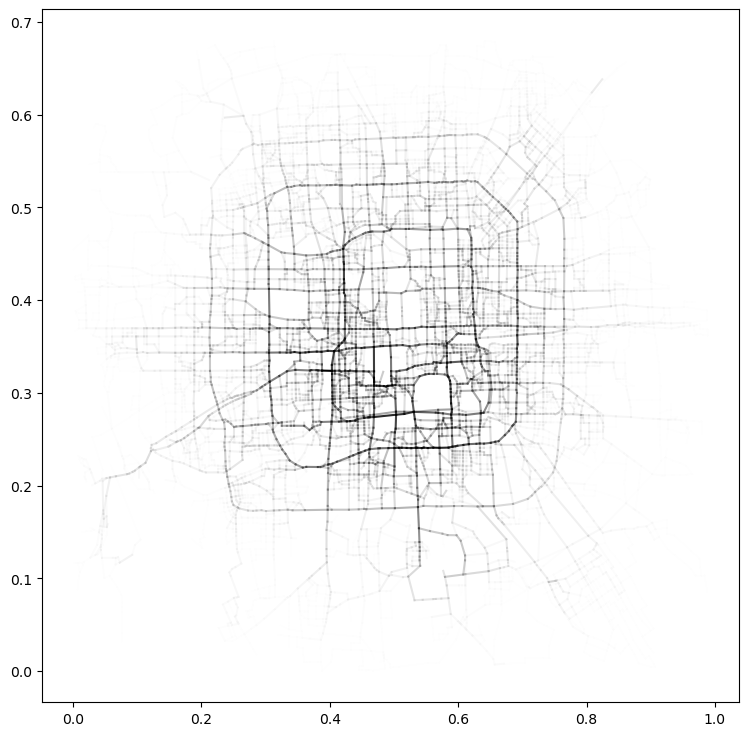

In [156]:
cmap = mpl.colormaps.get_cmap('Reds')
fig, ax = plt.subplots(figsize=(9, 9))
max_cnt = max(edge_cnt.values())
for edge_idx, cnt in edge_cnt.items():
    ec = node_coordinates[edges[edge_idx]]
    ax.plot(ec[:, 0], ec[:, 1], c=(0, 0, 0, cnt / max_cnt))

In [157]:
len(edge_cnt), edges.shape

(12057, (16784, 2))

Text(0.5, 0, '#Occurences of Edge')

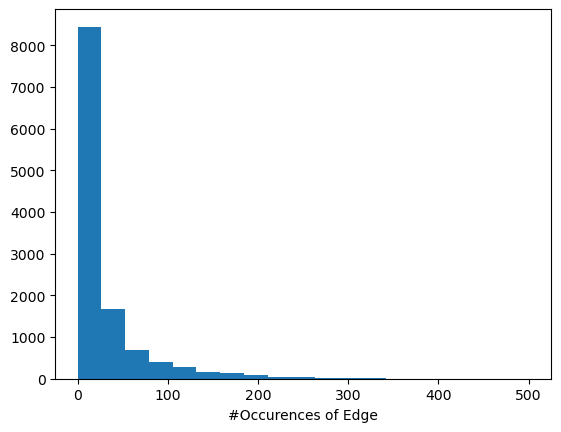

In [158]:
fig, ax = plt.subplots()
ax.hist(edge_cnt.values(), bins=np.linspace(0, 500, 20))
ax.set_xlabel('#Occurences of Edge')

#####Empirical Conditional and Unconditional Random Walk matrices

In [159]:
A_uncond = defaultdict(Counter) # From VxV -> probability
A_cond = defaultdict(lambda: defaultdict(Counter)) # From VxVxV -> probability (current, previous, next)

for key, path in paths.items():
    endpoints = edges[path['edge_idxs']]
    orientation = path['edge_orientations']
    endpoints[orientation != 1] = endpoints[orientation != 1][:, ::-1]
    assert (endpoints[1:, 0] == endpoints[:-1, 1]).all()
    for u, v in endpoints:
        A_uncond[u][v] += 1
    for (u, v), (v2, w) in zip(endpoints[:-1], endpoints[1:]):
        if v == v2:
            A_cond[v][u][w] += 1
        else:
            raise RuntimeError
    


In [160]:
prior = 20

node_entropies = dict()
for v, successors in tqdm(A_uncond.items()):
    probs = np.array(list(successors.values()), dtype=float) + prior
    probs /= probs.sum()
    node_entropies[v] = -(np.log(probs) * probs).sum()
    
conditional_node_entropies = defaultdict(dict)
for v, predecessors in tqdm(A_cond.items()):
    for prev, successors in predecessors.items():
        probs = np.array(list(successors.values()), dtype=float) + prior
        probs /= probs.sum()
        conditional_node_entropies[v][prev] = -(np.log(probs) * probs).sum() # H[vt+1 | vt, vt-1=v1]

conditional_kl_divergences = defaultdict(dict)
for v in tqdm(A_cond.keys()):
    predecessors = A_cond[v]
    for prev, successors in predecessors.items():
        cnt_cond, cnt_uncond = [], []
        for suc, cnt in successors.items():
            cnt_cond.append(cnt)
            cnt_uncond.append(A_uncond[v][suc])
        cnt_cond, cnt_uncond = np.array(cnt_cond, dtype=float) + prior, np.array(cnt_uncond, dtype=float) + prior
        cnt_cond /= cnt_cond.sum()
        cnt_uncond /= cnt_uncond.sum()
        conditional_kl_divergences[v][prev] = (cnt_uncond * (np.log(cnt_uncond) - np.log(cnt_cond))).sum()
        

100%|█████████████████████████████████████████████████████████████████| 7641/7641 [00:00<00:00, 7939.71it/s]


(7653, 4)


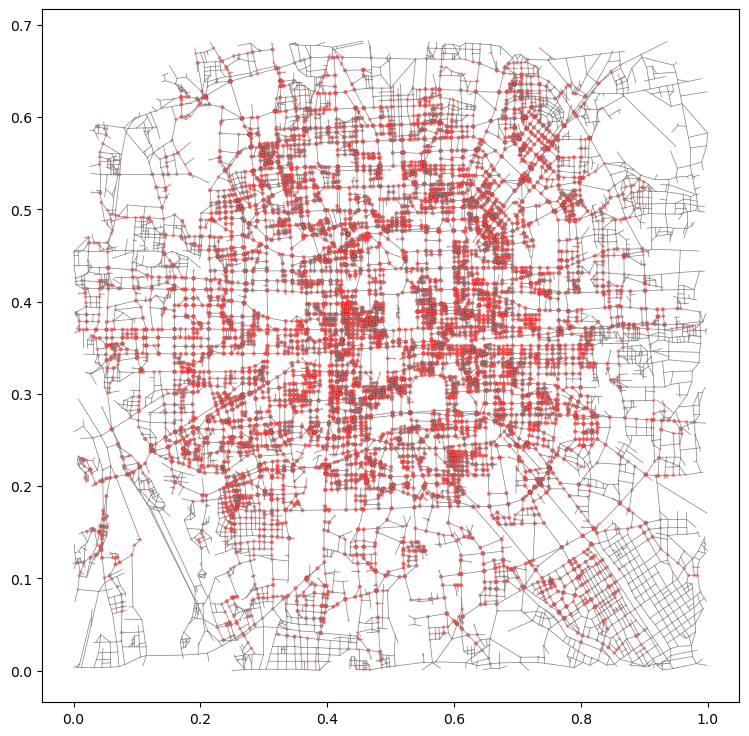

In [161]:
fig, ax = plt.subplots(figsize=(9, 9))
v, e = zip(*node_entropies.items())
v, e = np.array(v), np.exp(np.array(e))
c = np.array([[0, 0, 0, 1.]])
c = (e / e.max())[:, None] * c
c[:, 0] = 1
print(c.shape)

plt.scatter(node_coordinates[v][:, 0], node_coordinates[v][:, 1], s=e / e.max() * 10, c= c, zorder=2)
for ec in node_coordinates[edges]:
    ax.plot(ec[:, 0], ec[:, 1], lw=.5, c='grey')


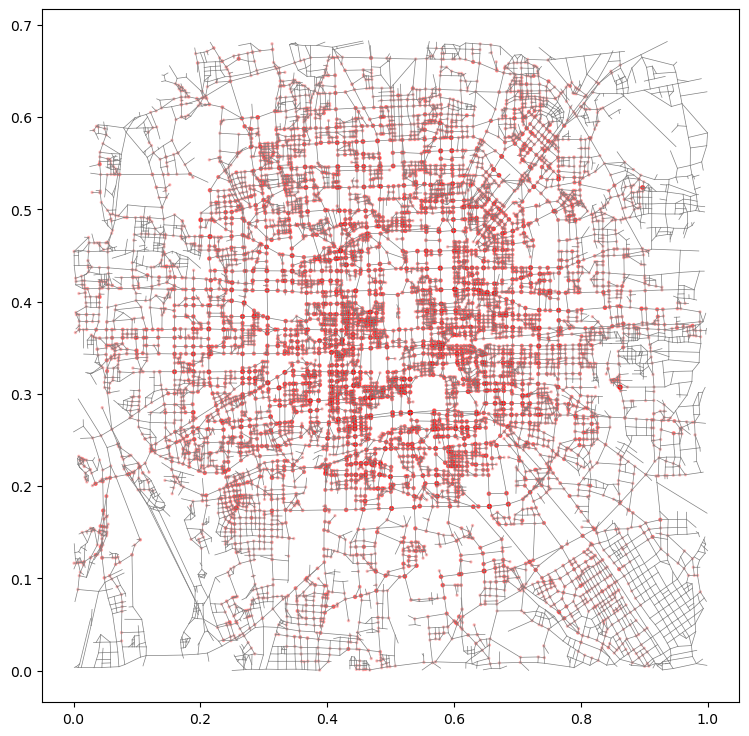

In [162]:

v, e = zip(*conditional_node_entropies.items())
e = np.array([np.mean(list(entropies.values())) for entropies in e])
e = np.exp(e)
v = np.array(v)

fig, ax = plt.subplots(figsize=(9, 9))
c = np.array([[0, 0, 0, 1.]])
c = (e / e.max())[:, None] * c
c[:, 0] = 1

plt.scatter(node_coordinates[v][:, 0], node_coordinates[v][:, 1], s=e / e.max() * 10, c= c, zorder=2)
for ec in node_coordinates[edges]:
    ax.plot(ec[:, 0], ec[:, 1], lw=.5, c='grey')

In [164]:

v, e = zip(*conditional_kl_divergences.items())
e = np.array([np.max(list(kldivs.values())) for kldivs in e])
v = np.array(v)

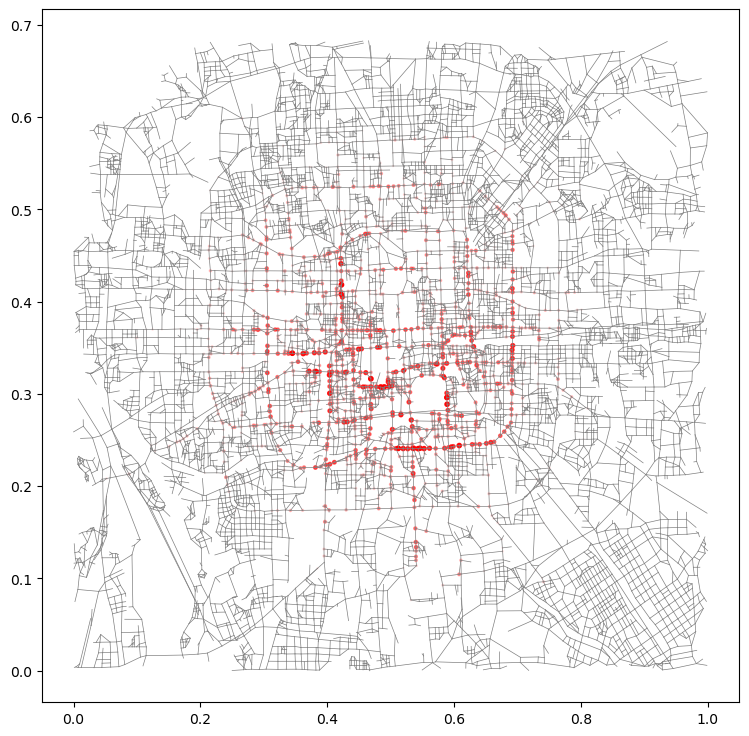

In [165]:


fig, ax = plt.subplots(figsize=(9, 9))
c = np.array([[0, 0, 0, 1.]])
c = (e / e.max())[:, None] * c
c[:, 0] = 1

plt.scatter(node_coordinates[v][:, 0], node_coordinates[v][:, 1], s=e / e.max() * 10, c= c, zorder=2)
for ec in node_coordinates[edges]:
    ax.plot(ec[:, 0], ec[:, 1], lw=.5, c='grey')

Plot conditional distributions at nodes with highest shifts¶

[[0.42208313 0.42263458]
 [0.42236546 0.41119224]
 [0.42011086 0.41772063]
 [0.42070832 0.41383212]]
[[0.42236546 0.41119224]
 [0.42011086 0.41772063]
 [0.42070832 0.41383212]
 [0.42208313 0.42263458]]
[[0.42208313 0.42263458]
 [0.42011086 0.41772063]]
[[0.42208313 0.42263458]]
[[0.42208313 0.42263458]
 [0.42236546 0.41119224]]
[[0.50794493 0.24085455]
 [0.51974297 0.24071664]
 [0.51236025 0.24534485]]
[[0.50794493 0.24085455]
 [0.51974297 0.24071664]
 [0.51236025 0.24534485]]
[[0.51974297 0.24071664]
 [0.50794493 0.24085455]
 [0.51236025 0.24534485]]
[[0.50794493 0.24085455]]
[[0.46081318 0.32305186]
 [0.46892318 0.323352  ]
 [0.46913319 0.31193217]]
[[0.46913319 0.31193217]
 [0.46081318 0.32305186]
 [0.46892318 0.323352  ]]


/tmp/ipykernel_1341142/675239259.py:34: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(node_coordinates[list(successors)][:, 0], node_coordinates[list(successors)][:, 1], c=c, cmap='Reds')


[[0.46913319 0.31193217]]
[[0.46081318 0.32305186]
 [0.46892318 0.323352  ]
 [0.46913319 0.31193217]]


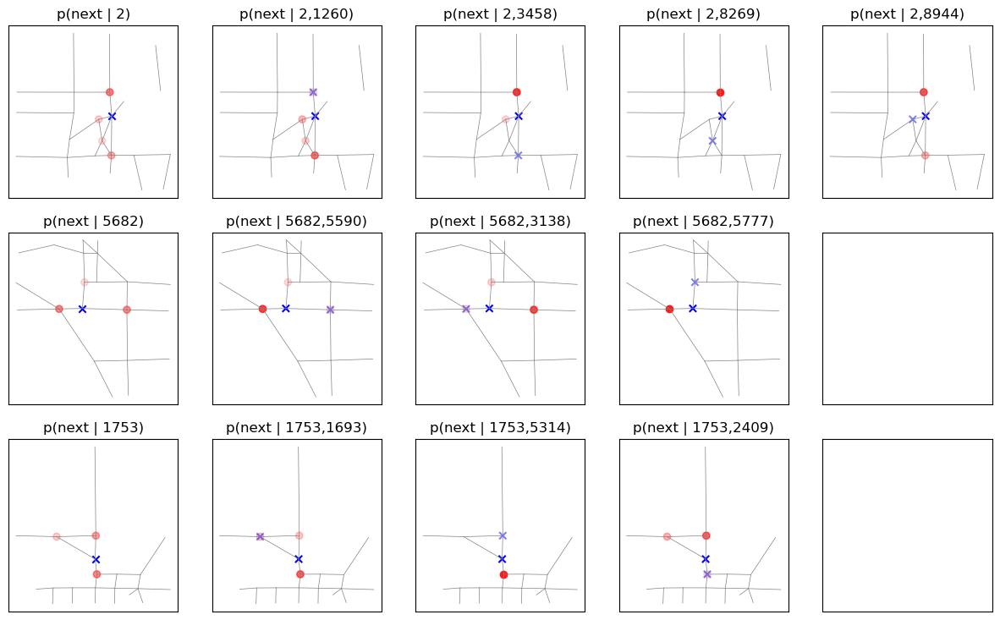

In [166]:
nodes_with_distribution_shift = list(sorted(conditional_kl_divergences, key=lambda v: -max(conditional_kl_divergences[v].values())))

k1, k2 = 3, 4

fig, axs = plt.subplots(k1, k2 + 1, figsize=(k2 * 3 + 3, k1 * 3))
for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
for v_idx, v in enumerate(nodes_with_distribution_shift[:k1]):
    # Get only the predecessors that shift the most
    preds = list(sorted(conditional_kl_divergences[v], key=lambda x: -max(conditional_kl_divergences[x].values())))
    vmin, vmax = node_coordinates[v], node_coordinates[v]
    edge_mask = (node_coordinates[edges] >= vmin[None, :] - 0.01).all(-1).any(-1) & (node_coordinates[edges] <= vmax[None, :] + 0.01).all(-1).any(-1) 
    
    for pred_idx, pred in enumerate([None] + preds[:k2]):
        ax = axs[v_idx, pred_idx]
        if pred is None:
            ax.set_title(f'p(next | {v})')
        else:
            ax.set_title(f'p(next | {v},{pred})')
        for ec in node_coordinates[edges[edge_mask]]:
            ax.plot(ec[:, 0], ec[:, 1], lw=.5, color='grey')
        
        if pred is None:
            successors, cnts = zip(*A_uncond[v].items())
        else:
            successors, cnts = zip(*A_cond[v][pred].items())
        cnts = np.array(cnts, dtype=float) + prior
        c = np.array([[0, 0, 0, 1.]])
        c = ((cnts / cnts.sum())[:, None] * c * 0.9) + 0.1
        c[:, 0] = 1
        
        print(node_coordinates[list(successors)])
        ax.scatter(node_coordinates[list(successors)][:, 0], node_coordinates[list(successors)][:, 1], c=c, cmap='Reds')
        if pred is None:
            ax.scatter(node_coordinates[[v]][:, 0], node_coordinates[[v]][:, 1], c=[(0, 0, 1, 1)], marker='x')
        else:
            ax.scatter(node_coordinates[[v, pred]][:, 0], node_coordinates[[v, pred]][:, 1], c=[(0, 0, 1, 1), (0, 0, 1, 0.5)], marker='x')
        
    


In [ ]:
keys = list(paths.keys())
#print(keys)
with h5py.File(merged_path) as hf:
   
        trajectory_coordinates = path['coordinates']
        trajectory_timestamps = path['timestamps']
        trajectory_edge_orientations = path['edge_orientations']
        trajectory_edge_idxs = path['edge_idxs']

In [73]:
f = h5py.File('/ceph/hdd/students/zhzo/T-drive/merged.h5', 'r')

In [74]:
f['graph'].keys()

<KeysViewHDF5 ['coordinate_scale', 'coordinate_shift', 'edge_features', 'edges', 'node_coordinates', 'node_features']>

In [226]:
f['graph']['edges'][:].shape

(16784, 2)

In [241]:
graph['node_features']['x']['11'][:]

array([116.3208398, 116.3214917, 116.3214295])

In [229]:
graph['node_coordinates'][()].min(axis=0), graph['node_coordinates'][()].max(axis=0)

(array([ 1.44042492e-05, -2.72632462e-04]), array([0.99985229, 0.68290869]))

In [75]:
n_trajectories = 0
n_plts = 0
n_subtrajectories = 0
len_subtrajectory = []

for tx in f['trajectories']:
    n_trajectories += 1
    for su in f['trajectories'][tx]['subtrajectories']:
        n_subtrajectories += 1
        len_subtrajectory.append(f['trajectories'][tx]['subtrajectories'][su]['edge_idxs'][:].shape[0])
len_subtrajectory = np.array(len_subtrajectory)

In [76]:
n_trajectories, n_plts, n_subtrajectories

(10336, 0, 2414)

In [78]:
len_subtrajectory[8]

113

In [79]:
for i in range(11):
    print(i, (len_subtrajectory == i).sum())

0 0
1 708
2 21
3 12
4 24
5 15
6 16
7 10
8 13
9 13
10 18


In [80]:
(len_subtrajectory > 100).sum()

1008

In [81]:
len_subtrajectory.shape

(2414,)